# A Study on Bike Rentals in Seoul

### Group name: Bike Experts
#### *Team members: Yuyang Wang, Muhan Yang, Zijian Cheng*


## Introduction
In this study on bike rentals in Seoul, our aim is to delve into data wrangling, processing and visualization. We want to develop skills of tidying up our data and and modifying it to suit the tasks at hand. Also, we seek to improve our visualization design skills by exploring various types of visualizations to identify the one that best fits our objectives.


#### Audience
Our primary audience comprises young to middle-aged citizens of Seoul, as it is predominantly these age groups that engage in bike rentals within the city. They may be interested in understanding the availability of bikes for rent under various circumstances. Another potential audience is the bike rental companies who may want to ascertain the rush hours for bike rentals to better manage their inventory and staff schedules.

#### Motivation
Citizens may wish to avoid rush hours or reserve bikes beforehand to ensure availability. On the other hand, rental companies might want to identify rush hours to better prepare for the increased demand. Hence, our audience can utilize the visualizations to understand the rental trends based on different conditions (such as weather and temperature) and plan their actions accordingly.


## Overall Task Analysis

Initially, the visualization platform should feature two main tabs: "Overview" and "Trending", with four sub-tabs under each main tab corresponding to the four seasons.

In the "Overview" tab, the visualization should display the total number of bike rentals per day, encoded on the y-axis. An area plot will depict the distribution of rental numbers throughout the year, with the data encoded on the x-axis (Characterize Distribution). A tooltip for each day should display the date, total number of rentals, and whether the day falls on a weekend or a holiday. Clicking on a specific day should reveal a detailed distribution of rental numbers for each hour of that day.

For the second part "Trending", the visualization is aiming for finding the trend between amount of bike rental and the temperature or time in a day, therefore a line plot is used to show the trending(Correlate). The average of amount of renting is encoded in the y-axis channel, and the temperature or time in the day is encoded in the x-axis channel. There should be a dropdown menu for the audience to select which trend they want to see. There should also be 4 tabs to allow the audience to switch between the 4 seasons(Filter). Tooltip should also be available for this visualization, showing the average amount of bike rental(Retrieve value), temperature/time of the day. The range of amount of bike rentals is also provided to the audience in the visualization.(Determine Range)

These structured visualizations aim to provide a comprehensive insight into bike rental trends in Seoul, catering to the needs of both the citizens and rental companies, thereby aiding in making informed decisions.

### Five distinct tasks corresponding to low-fidelity sketches:
   1. Correlate - Is there more bike rental on weekends than that on workdays throughout the year?
   2. Sort & Filter - Rank month by the highest number of bike rental on holidays and non-holidays.
   3. Characterize distribution - What is the daily bike rental distribution for each season?
   4. Determine range - Whar is the range of bike rental numbers across different temperatures in each seasons?
   5. Retrive value - What will be the average rental numbers for each hour?

## Initial Exploration
### Preliminary Exploratory Analysis
#### *Loading the required libraries, reading the CSV file, modifying data and previewing the data frame.*

In [1]:
import pandas as pd
import altair as alt

# Read the dataset
url = 'https://raw.githubusercontent.com/yuwangy/Seoul_bike_rental_viz/main/SeoulBikeData.csv'
data = pd.read_csv(url, encoding='latin-1')
data.head()

# Add 'Month' as ordinal attribute
data['Date'] = pd.to_datetime(data['Date'], format='%d/%m/%Y')

# Create 'Month' column based on date
data['Month'] = data['Date'].dt.month

# Add 'Weekend' as nominal attribute, determine if the date is on a weekend 
data['Weekend'] = data['Date'].dt.dayofweek.apply(lambda x: 'Yes' if x >= 5 else 'No')

data.head(10)



,Date,Rented Bike Count,Hour,Temperature(°C),Humidity(%),Wind speed (m/s),Visibility (10m),Dew point temperature(°C),Solar Radiation (MJ/m2),Rainfall(mm),Snowfall (cm),Seasons,Holiday,Functioning Day,Month,Weekend
0,2017-12-01,254,0,-5.2,37,2.2,2000,-17.6,0.00,0.0,0.0,Winter,No Holiday,Yes,12,No
1,2017-12-01,204,1,-5.5,38,0.8,2000,-17.6,0.00,0.0,0.0,Winter,No Holiday,Yes,12,No
2,2017-12-01,173,2,-6.0,39,1.0,2000,-17.7,0.00,0.0,0.0,Winter,No Holiday,Yes,12,No
3,2017-12-01,107,3,-6.2,40,0.9,2000,-17.6,0.00,0.0,0.0,Winter,No Holiday,Yes,12,No
4,2017-12-01,78,4,-6.0,36,2.3,2000,-18.6,0.00,0.0,0.0,Winter,No Holiday,Yes,12,No
5,2017-12-01,100,5,-6.4,37,1.5,2000,-18.7,0.00,0.0,0.0,Winter,No Holiday,Yes,12,No
6,2017-12-01,181,6,-6.6,35,1.3,2000,-19.5,0.00,0.0,0.0,Winter,No Holiday,Yes,12,No
7,2017-12-01,460,7,-7.4,38,0.9,2000,-19.3,0.00,0.0,0.0,Winter,No Holiday,Yes,12,No
8,2017-12-01,930,8,-7.6,37,1.1,2000,-19.8,0.01,0.0,0.0,Winter,No Holiday,Yes,12,No
9,2017-12-01,490,9,-6.5,27,0.5,1928,-22.4,0.23,0.0,0.0,Winter,No Holiday,Yes,12,No


## Data Abstraction
#### Printing out the semantics, the data attribute type, the cardinality for each attribute.

In [2]:
# Create data abstraction for Seoul Bike Rental Dataset in the form of csv table

url = 'https://raw.githubusercontent.com/yuwangy/Seoul_bike_rental_viz/main/Seoul%20Bike%20Rental%20Data%20Abstraction.csv'
data_abstraction = pd.read_csv(url)
data_abstraction



,Unnamed: 0,Semantics,Attribute Type,Cardinality
0,Date,The specific day of the month of the year,Temporal,01-12-2017 to 30-11-2018
1,Rented Bike Count,The specific number of bikes rented in given hour,Quantitative,0 - 3556 bikes rented
2,Hour,The specific hour of the day ...,Ordinal,24
3,Temperature (°C),The temperature in given hour,Quantitative,-17.8 - 39.4 °C
4,Humidity (%),The humidity in given hour,Quantitative,0 - 98 % humidity
5,Wind speed (m/s),The wind speed in given hour,Quantitative,0 - 7.4 m/s wind speed
6,Visibility (10m),The visibility (how far you can see clearly) i...,Quantitative,27 - 2000 (10m) visibility
7,Dew point temperature (°C),The dew point temperature in given hour,Quantitative,-30.6 - 27.2 °C dew point temperature
8,Solar Radiation (MJ/m2),The amount of solar radiation in given hour,Quantitative,0 - 3.52 (MJ/m2)
9,Rainfall (mm),The amount of rain in given hour,Quantitative,0 - 35 (mm)


## Exploratory Data Analysis
#### *Printing out size of data, names of columns, etc.*

In [4]:
# EDA for the rental bike dataset

# Print the shape
print(data.shape)

# Print the info
print(data.info())

# Print the names of the columns
print(data.columns)



(8760, 16)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8760 entries, 0 to 8759
Data columns (total 16 columns):
 #   Column                     Non-Null Count  Dtype         
---  ------                     --------------  -----         
 0   Date                       8760 non-null   datetime64[ns]
 1   Rented Bike Count          8760 non-null   int64         
 2   Hour                       8760 non-null   int64         
 3   Temperature(°C)            8760 non-null   float64       
 4   Humidity(%)                8760 non-null   int64         
 5   Wind speed (m/s)           8760 non-null   float64       
 6   Visibility (10m)           8760 non-null   int64         
 7   Dew point temperature(°C)  8760 non-null   float64       
 8   Solar Radiation (MJ/m2)    8760 non-null   float64       
 9   Rainfall(mm)               8760 non-null   float64       
 10  Snowfall (cm)              8760 non-null   float64       
 11  Seasons                    8760 non-null   object        


#### *Printing out extreme values on numerical attributes.*

In [5]:
# Obtaining the extreme quantitative values in the data 

# Extract maximum and minimum Rented Bike Count
max_rented_bike_count = data['Rented Bike Count'].max()
print(f'maximum bikes rented: {max_rented_bike_count}')
min_rented_bike_count = data['Rented Bike Count'].min()
print(f'minimum bikes rented: {min_rented_bike_count}')

# Extract highest and lowest temperature
highest_temperature = data['Temperature(°C)'].max()
print(f'highest temperature: {highest_temperature}')
lowest_temperature = data['Temperature(°C)'].min()
print(f'lowest temperature: {lowest_temperature}')

# Extract highest and lowest humidity
highest_humidity = data['Humidity(%)'].max()
print(f'highest humidity: {highest_humidity}')
lowest_humidity = data['Humidity(%)'].min()
print(f'lowest humidit: {lowest_humidity}')

# Extract maximum and minimum wind speed
max_wind_speed = data['Wind speed (m/s)'].max()
print(f'maximum wind speed: {max_wind_speed}')
min_wind_speed = data['Wind speed (m/s)'].min()
print(f'minimum wind speed: {min_wind_speed}')

# Extract maximum and minimum visibility
max_visibility = data['Visibility (10m)'].max()
print(f'maximum visibility: {max_visibility}')
min_visibility = data['Visibility (10m)'].min()
print(f'minimum visibility: {min_visibility}')

# Extract highest and lowest dew point temperature
highest_dew_point_temperature = data['Dew point temperature(°C)'].max()
print(f'highest dew point temperature: {highest_dew_point_temperature}')
lowest_dew_point_temperature = data['Dew point temperature(°C)'].min()
print(f'lowest dew point temperature: {lowest_dew_point_temperature}')

# Extract maximum and minimum solar radiation
max_solar_radiation = data['Solar Radiation (MJ/m2)'].max()
print(f'maximum solar radiation: {max_solar_radiation}')
min_solar_radiation = data['Solar Radiation (MJ/m2)'].min()
print(f'minimum solar radiation: {min_solar_radiation}')

# Extract maximum and minimum rainfall
max_rainfall = data['Rainfall(mm)'].max()
print(f'maximum rainfall: {max_rainfall}')
min_rainfall = data['Rainfall(mm)'].min()
print(f'minimum rainfall: {min_rainfall}')

# Extract maximum and minimum snowfall
max_snowfall = data['Snowfall (cm)'].max()
print(f'maximum snowfall: {max_snowfall}')
min_snowfall = data['Snowfall (cm)'].min()
print(f'minimum snowfall: {min_snowfall}')



maximum bikes rented: 3556
minimum bikes rented: 0
highest temperature: 39.4
lowest temperature: -17.8
highest humidity: 98
lowest humidit: 0
maximum wind speed: 7.4
minimum wind speed: 0.0
maximum visibility: 2000
minimum visibility: 27
highest dew point temperature: 27.2
lowest dew point temperature: -30.6
maximum solar radiation: 3.52
minimum solar radiation: 0.0
maximum rainfall: 35.0
minimum rainfall: 0.0
maximum snowfall: 8.8
minimum snowfall: 0.0


## Numerical Summaries for all attributes
#### *Conducting central tendency measures, creating frequency table.*

In [6]:
# Statistical summaries for numerical attributes (central tendency measures)

data.describe()


,Date,Rented Bike Count,Hour,Temperature(°C),Humidity(%),Wind speed (m/s),Visibility (10m),Dew point temperature(°C),Solar Radiation (MJ/m2),Rainfall(mm),Snowfall (cm),Month
count,8760,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000
mean,2018-05-31 23:59:59.999999744,704.602055,11.500000,12.882922,58.226256,1.724909,1436.825799,4.073813,0.569111,0.148687,0.075068,6.526027
min,2017-12-01 00:00:00,0.000000,0.000000,-17.800000,0.000000,0.000000,27.000000,-30.600000,0.000000,0.000000,0.000000,1.000000
25%,2018-03-02 00:00:00,191.000000,5.750000,3.500000,42.000000,0.900000,940.000000,-4.700000,0.000000,0.000000,0.000000,4.000000
50%,2018-06-01 00:00:00,504.500000,11.500000,13.700000,57.000000,1.500000,1698.000000,5.100000,0.010000,0.000000,0.000000,7.000000
75%,2018-08-31 00:00:00,1065.250000,17.250000,22.500000,74.000000,2.300000,2000.000000,14.800000,0.930000,0.000000,0.000000,10.000000
max,2018-11-30 00:00:00,3556.000000,23.000000,39.400000,98.000000,7.400000,2000.000000,27.200000,3.520000,35.000000,8.800000,12.000000
std,NaN,644.997468,6.922582,11.944825,20.362413,1.036300,608.298712,13.060369,0.868746,1.128193,0.436746,3.448048


In [7]:
# Obtain frequency table of all attributes

print(data['Date'].value_counts())
print(data['Rented Bike Count'].value_counts())
print(data['Hour'].value_counts())
print(data['Temperature(°C)'].value_counts())
print(data['Humidity(%)'].value_counts())
print(data['Wind speed (m/s)'].value_counts())
print(data['Visibility (10m)'].value_counts())
print(data['Dew point temperature(°C)'].value_counts())
print(data['Solar Radiation (MJ/m2)'].value_counts())
print(data['Rainfall(mm)'].value_counts())
print(data['Snowfall (cm)'].value_counts())
print(data['Seasons'].value_counts())
print(data['Holiday'].value_counts())
print(data['Functioning Day'].value_counts())
print(data['Month'].value_counts())
print(data['Weekend'].value_counts())



Date
2017-12-01    24
2018-08-09    24
2018-08-07    24
2018-08-06    24
2018-08-05    24
              ..
2018-03-31    24
2018-03-30    24
2018-03-29    24
2018-03-28    24
2018-11-30    24
Name: count, Length: 365, dtype: int64
Rented Bike Count
0       295
122      19
223      19
262      19
165      18
       ... 
2096      1
2440      1
1600      1
3384      1
595       1
Name: count, Length: 2166, dtype: int64
Hour
0     365
1     365
22    365
21    365
20    365
19    365
18    365
17    365
16    365
15    365
14    365
13    365
12    365
11    365
10    365
9     365
8     365
7     365
6     365
5     365
4     365
3     365
2     365
23    365
Name: count, dtype: int64
Temperature(°C)
 19.1    40
 20.5    40
 23.4    39
 7.6     38
 20.7    38
         ..
-13.6     1
-12.9     1
-12.6     1
 37.6     1
 36.9     1
Name: count, Length: 546, dtype: int64
Humidity(%)
53    173
97    173
43    164
57    159
56    157
     ... 
19     11
13      3
10      1
12      1
11      1

## Data Visualization and Design
#### *Creating visual summaries, including univariate and multi-variate.*

In [ ]:
# Activate the VegaFusion data transformer
import altair as alt
alt.data_transformers.enable("vegafusion")


# Histograms for various attributes
hist_bike_count = alt.Chart(data).mark_circle(size=60).encode(
    alt.X('Rented Bike Count:Q', bin = alt.Bin(maxbins = 100)),
    alt.Y('count()'),
    alt.Tooltip(['count()', 'Rented Bike Count:Q']),
).properties(
    width = 500,
    height = 150,
    title = 'Histogram for Rented Bike Count',
).interactive()

display(hist_bike_count)



hist_temperature = alt.Chart(data).mark_circle(size=60).encode(
    alt.X('Temperature(°C):Q', bin = alt.Bin(maxbins = 100)),
    alt.Y('count()'),
    alt.Tooltip(['count()', 'Temperature(°C):Q']),
).properties(
    width = 500,
    height = 150,
    title = 'Histogram for Temperature(°C)',
).interactive()

display(hist_temperature)



hist_humidity = alt.Chart(data).mark_circle(size=60).encode(
    alt.X('Humidity(%):Q', bin = alt.Bin(maxbins = 100)),
    alt.Y('count()'),
    alt.Tooltip(['count()', 'Humidity(%):Q']),
).properties(
    width = 500,
    height = 150,
    title = 'Histogram for Humidity(%)',
).interactive()

display(hist_humidity)



hist_windspeed = alt.Chart(data).mark_circle(size=60).encode(
    alt.X('Wind speed (m/s):Q', bin = alt.Bin(maxbins = 100)),
    alt.Y('count()'),
    alt.Tooltip(['count()', 'Wind speed (m/s):Q']),
).properties(
    width = 500,
    height = 150,
    title = 'Histogram for Wind speed (m/s)',
).interactive()

display(hist_windspeed)



hist_visibility = alt.Chart(data).mark_circle(size=60).encode(
    alt.X('Visibility (10m):Q', bin = alt.Bin(maxbins = 100)),
    alt.Y('count()'),
    alt.Tooltip(['count()', 'Visibility (10m):Q']),
).properties(
    width = 500,
    height = 150,
    title = 'Histogram for Visibility (10m)',
).interactive()

display(hist_visibility)



hist_solar_radiation = alt.Chart(data).mark_circle(size=60).encode(
    alt.X('Solar Radiation (MJ/m2):Q', bin = alt.Bin(maxbins = 100)),
    alt.Y('count()'),
    alt.Tooltip(['count()', 'Solar Radiation (MJ/m2):Q']),
).properties(
    width = 500,
    height = 150,
    title = 'Histogram for Solar Radiation (MJ/m2)',
).interactive()

display(hist_solar_radiation)



hist_rainfall = alt.Chart(data).mark_circle(size=60).encode(
    alt.X('Rainfall(mm):Q', bin = alt.Bin(maxbins = 100)),
    alt.Y('count()'),
    alt.Tooltip(['count()', 'Rainfall(mm):Q']),
).properties(
    width = 500,
    height = 150,
    title = 'Histogram for Rainfall(mm)',
).interactive()

display(hist_rainfall)



hist_snowfall = alt.Chart(data).mark_circle(size=60).encode(
    alt.X('Snowfall (cm):Q', bin = alt.Bin(maxbins = 100)),
    alt.Y('count()'),
    alt.Tooltip(['count()', 'Snowfall (cm):Q']),
).properties(
    width = 500,
    height = 150,
    title = 'Histogram for Snowfall (cm)',
).interactive()

display(hist_snowfall)



#### *Multi-Variate Visual Summaries.*

In [8]:
# Create simple visual summaries, bar charts, line charts, boxplot charts etc

# Boxplot to identify outliers in Hourly Rented Bike Count
bikecount_boxplot_chart = alt.Chart(data).mark_boxplot().encode(
    alt.X('Hour:O'),
    alt.Y('Rented Bike Count:Q', title = 'Hourly Rented Bike Count'),
).properties(
    width = 500,
    height = 300,
    title = 'Boxplot chart for Hourly Rented Bike Count',
)

display(bikecount_boxplot_chart)



# The sum of Rented Bike Count across various hours of day
bikecount_barchart = alt.Chart(data).mark_bar().encode(
    alt.X('Hour:O', sort = '-y'),
    alt.Y('sum(Rented Bike Count):Q'),
    alt.Color('Seasons:N'),
    alt.Tooltip('Date'),
).properties(
    width = 500,
    height = 350,
    title = 'Stacked Barchart for Hourly Sum Rented Bike Count',
)

display(bikecount_barchart)



# Sum values of Rented Bike Count across 4 seasons of year
seasons_bikecount_barchart = alt.Chart(data).mark_bar().encode(
    alt.Y('Seasons:N', sort = 'x'),
    alt.X('sum(Rented Bike Count):Q'),
    alt.Color('Month:O'),
    alt.Tooltip('sum(Rented Bike Count):Q'),
).properties(
    width = 500,
    height = 150,
    title = 'Barchart for Season Sum Rented Bike Count',
)

display(seasons_bikecount_barchart)



# Density plot for Rented Bike Count
bikecount_density_chart = alt.Chart(data).mark_area().encode(
    x='Rented Bike Count:Q',
    y='density:Q',
).transform_density(
    'Rented Bike Count',
    as_=['Rented Bike Count', 'density'],
).properties(
    width = 500,
    height = 300,
    title = 'Density plot for Rented Bike Count',
)

display(bikecount_density_chart)



# Heatmap for Rented Bike Count by Hour & Month
bikecount_heatmap = alt.Chart(data).mark_rect().encode(
    alt.Y('Month:O'),
    alt.X('Hour:O'),
    alt.Color('Rented Bike Count:Q'),
    alt.Tooltip('Date'),
).properties(
    width = 500,
    height = 250,
    title = 'Heatmap for Rented Bike Count by Hour & Month',
)

display(bikecount_heatmap)




alt.Chart(...)

alt.Chart(...)

alt.Chart(...)

alt.Chart(...)

alt.Chart(...)

#### *Concatenating charts for comparison.*

In [9]:
# Concatenating charts for comparison, analyzing scale of influence factors

# Line chart for Rented Bike Count by temperature
bikecount_temperature_linechart = alt.Chart(data).mark_line(point = True).encode(
    alt.X('Temperature(°C):Q', bin = alt.Bin(maxbins = 30)),
    alt.Y('mean(Rented Bike Count):Q'),
    alt.Color('Seasons:N'),
    alt.Tooltip('mean(Rented Bike Count):Q'),
).properties(
    width = 500,
    height = 300,
    title = 'Linechart for Mean Rented Bike Count by Temperature',
)

# display(bikecount_temperature_linechart)

# Line chart for Rented Bike Count by humidity
bikecount_humidity_linechart = alt.Chart(data).mark_line(point = True).encode(
    alt.X('Humidity(%):Q', bin = alt.Bin(maxbins = 30)),
    alt.Y('mean(Rented Bike Count):Q'),
    alt.Color('Seasons:N'),
    alt.Tooltip('mean(Rented Bike Count):Q'),
).properties(
    width = 500,
    height = 300,
    title = 'Linechart for Mean Rented Bike Count by Humidity',
)

# display(bikecount_humidity_linechart)

# concatenating two line charts horizontally
side_by_side_linecharts = alt.hconcat(bikecount_temperature_linechart, bikecount_humidity_linechart)
display(side_by_side_linecharts)





# Scatter plot for Rainfall vs. Rented Bike Count
bikecount_rainfall_scatter = alt.Chart(data).mark_circle(size = 50).encode(
    alt.X('Rainfall(mm)'),
    alt.Y('Rented Bike Count'),
    alt.Tooltip('Rented Bike Count'),
).properties(
    width = 500,
    height = 350,
    title = 'Scatter plot for Rainfall & Rented Bike Count',
)

# display(bikecount_rainfall_scatter)

# Scatter plot for Snowfall vs. Rented Bike Count
bikecount_snowfall_scatter = alt.Chart(data).mark_circle(size = 50).encode(
    alt.X('Snowfall (cm)'),
    alt.Y('Rented Bike Count'),
    alt.Tooltip('Rented Bike Count'),
).properties(
    width = 500,
    height = 350,
    title = 'Scatter plot for Snowfall & Rented Bike Count',
)

# display(bikecount_snowfall_scatter)

# concatenating two scatter plots horizontally
side_by_side_scattercharts = alt.hconcat(bikecount_rainfall_scatter, bikecount_snowfall_scatter)
display(side_by_side_scattercharts)






# # Scatter matrix chart for Rented Bike Count
# bikecount_scatter_matrix = alt.Chart(data).mark_circle(size = 50).encode(
#     alt.X(alt.repeat("column"), type='quantitative'),
#     alt.Y(alt.repeat("row"), type='quantitative'),
# ).properties(
#     width = 100,
#     height = 100,
#     title = 'Scatter matrix plot for Rented Bike Count by rainfall & snowfall',
# ).repeat(
#     row=['Rainfall(mm)', 'Snowfall (cm)', 'sum(Rented Bike Count)'],
#     column=['Rainfall(mm)', 'Snowfall (cm)', 'sum(Rented Bike Count)'],
# )

# display(bikecount_scatter_matrix)




alt.HConcatChart(...)

alt.HConcatChart(...)

## Visualization Ideas
#### *Preliminary Sketches*

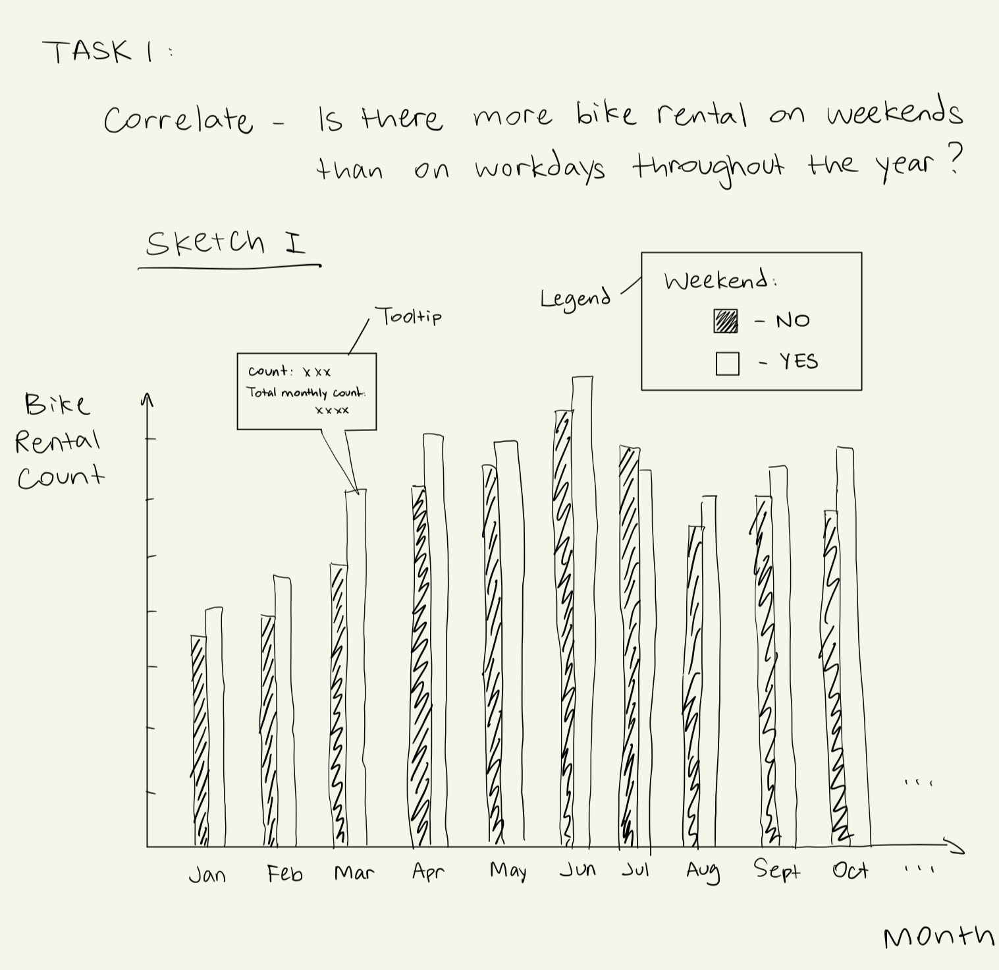

### Critique
The Sketch I above displays the quantitative comparison between rental numbers on weekend and numbers on weekdays. The marks are made of bars and tooltip added as count of total monthly rentals, with vertical position (y-axis) of the mark representing monthly bike rental count. The horizontal position (x-axis) illustrates the months of year. In terms of expressiveness, the bar chart shows the quantitative values clearly and easier to compare which is more or less. It is effective at appealing the public viewers who are interested in renting bikes on weekends and potentially preparing for the crowdedness and lack of available bikes, and appealing the rental company as they are now aware of increasing the supply to to meet the more demands on weekends.  

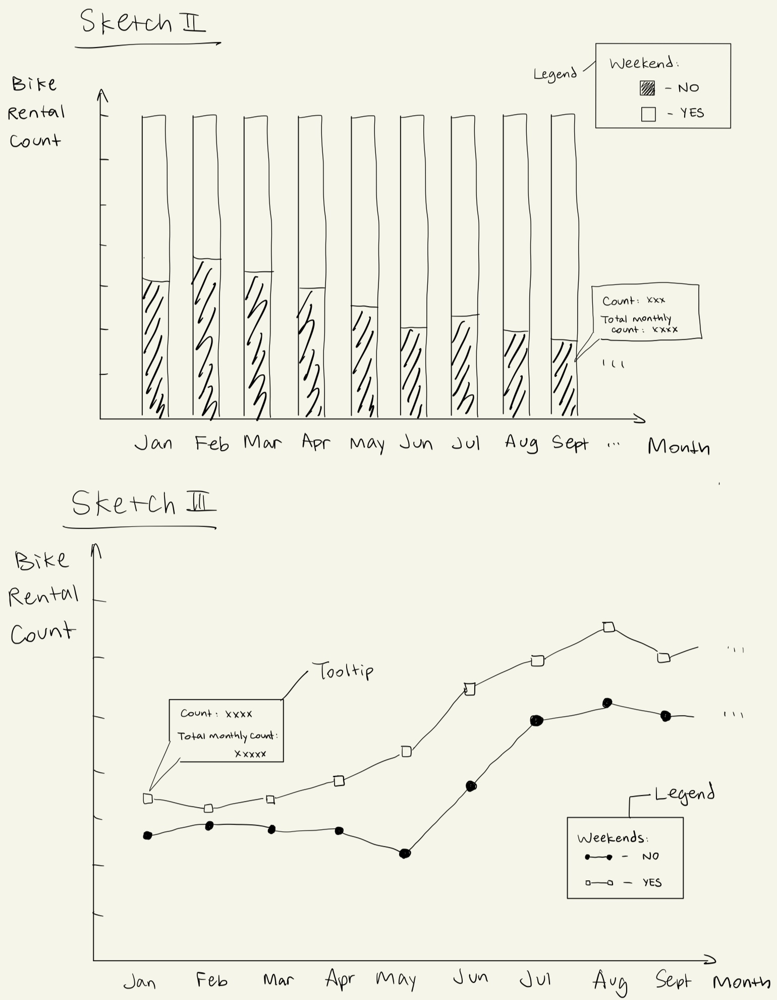

### Critique

The Sketch II above is in the form of normalized stacked bar chart. The marks are bars and tooltip added as count of monthly rentals, with vertical position (y-axis) of marks stating monthly bike rentals on weekends and weekdays respectively and weekends bar stacked on top of weekdays bar. The horizontal position (x-axis) states the months of year. However, it only demonstrates the percentage of the whole based on the proportion of length. It is effective at presenting the part-to-whole relationship but it does not provide clear correlations among data. 


The Sketch III above is in the form of multi-line chart. The marks are made of multiple lines and again tooltip added as count of monthly rentals, with shaded thicker line representing weekdays and thinner line corresponding to weekends. It is effective at presenting the general trendline of rentals across various months of the year, where the sketch displays a clear correlation in data between two nominal categories.



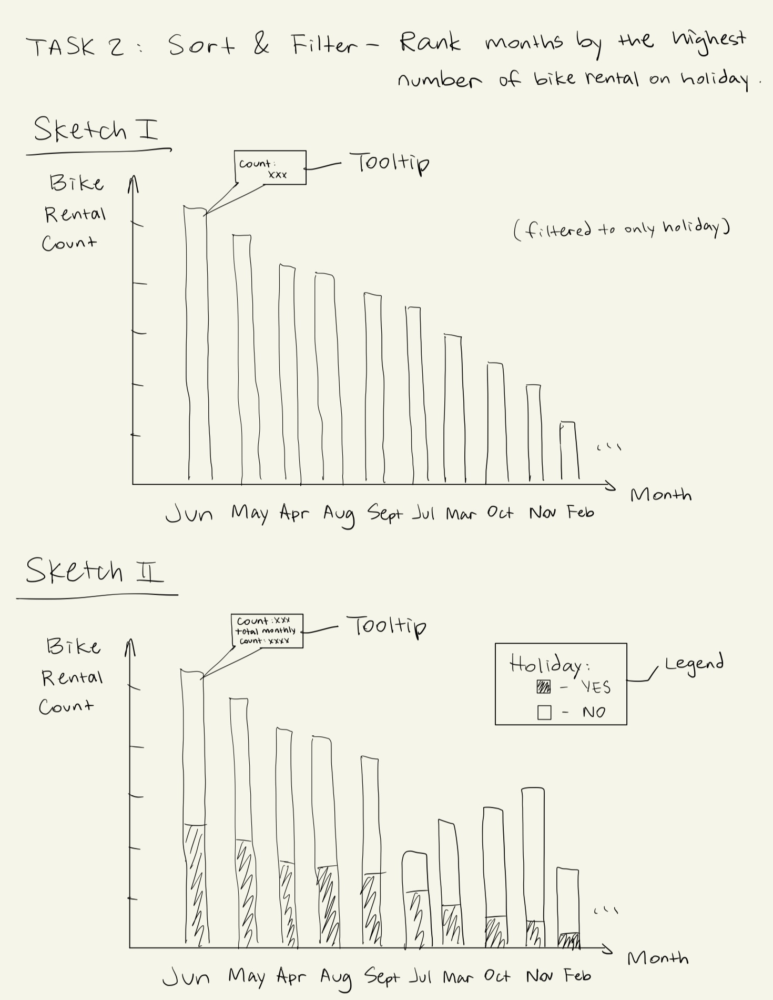

### Critique
The Sketch I above is in the form of sorted bar chart (highest bar closest to y-axis), filtered to holiday date. The marks are bars and tooltip added as count of monthly rentals, with vertical position (y-axis) of marks stating monthly bike rentals on holidays. The horizontal position (x-axis) states the months of year. It is effective at showing the maximum rentals and minimum ones, apparent for general public and rental companies to make correlations among date so they comprehend the months of year on holidays where they will face bike shortage or increased demand.


The Sketch II above is a stacked bar chart similar to task 1, but it is not normalized and non-holiday bars are stacked on top of the holiday bars. The marks are bars, encoded with tooltips demonstrating monthly rental numbers. Additional channels such as size, shape, colour have not been used, it needs further modification to increase effectiveness in order to capture the attention of viewers.


The Sketch III below presents monthly rental numbers on holiday days and non-holiday ones, with additional change that both categories start from 0 on y-axis. The marks are made of stacked bars, the channnels such as vertical positions and horizontal positions represent bike rental numbers and months as usual, with tooltip as monthly total count. It offers the viewers the choice to sort either one of two categories, which illustrates more data information under the same space.


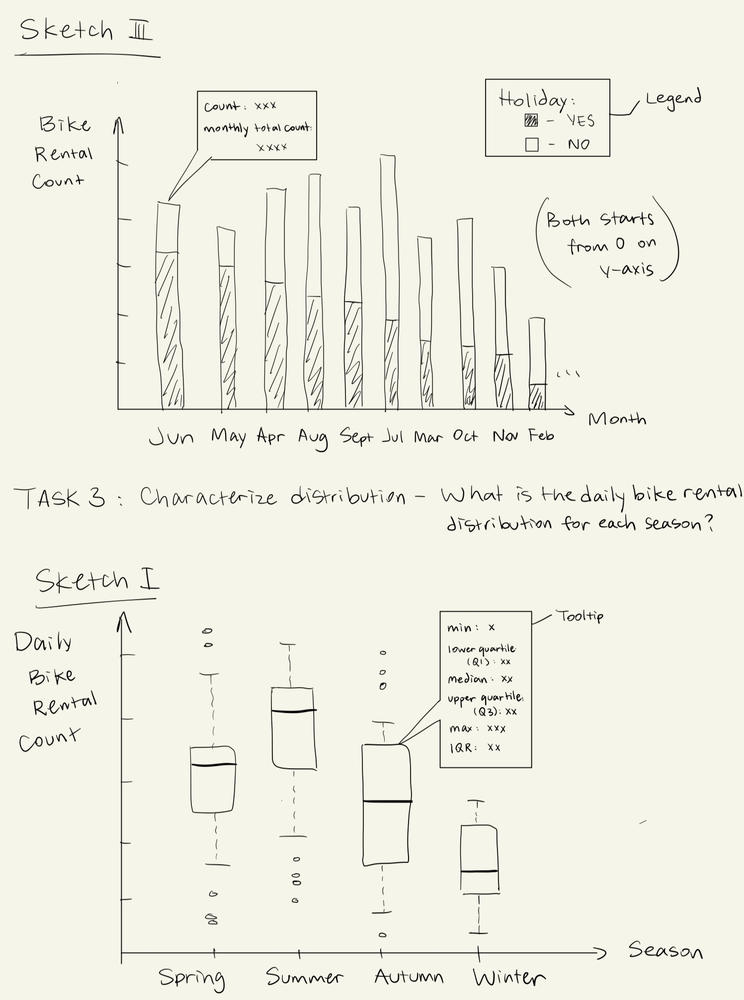

### Critique
The Sketch I above is effective at displaying the distribution of rental numbers among various seasons. The marks are made of boxplots, the information from tooltip presents the statistical details which is helpful for performing statistical analysis, inference, etc. 

The Sketch II below uses channels such as colours which represent four seasons to encode the chart. The horizontal position states daily bike rentals. It lacks clarification on the intention of the chart and creates confusion to the viewers, whether it is aimed to display distribution by area or compare the height of the top squares. 

The Sketch III below is in the form of area chart. The marks are made of areas under the curves. Similarly, the colour channels are used to represent the four seasons. The horizontal position channel states hours of the day while vertical position channel states the number of daily rentals. It is effective at presenting the distribution of bike rentals across various hours of day to the audience. 


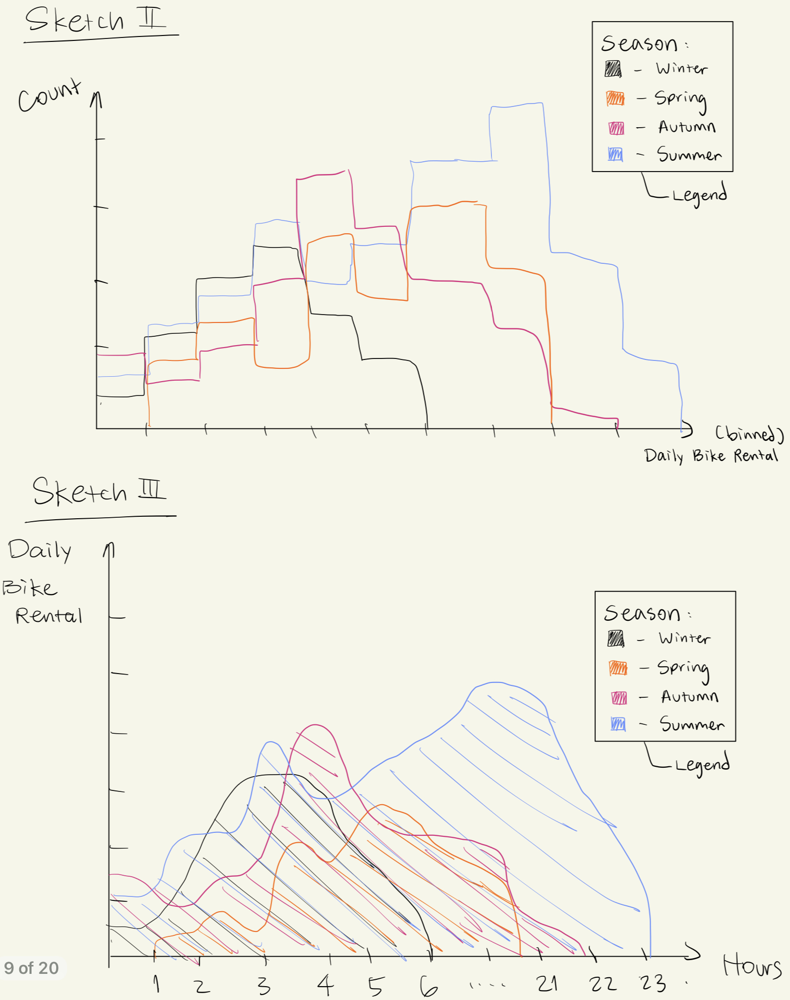

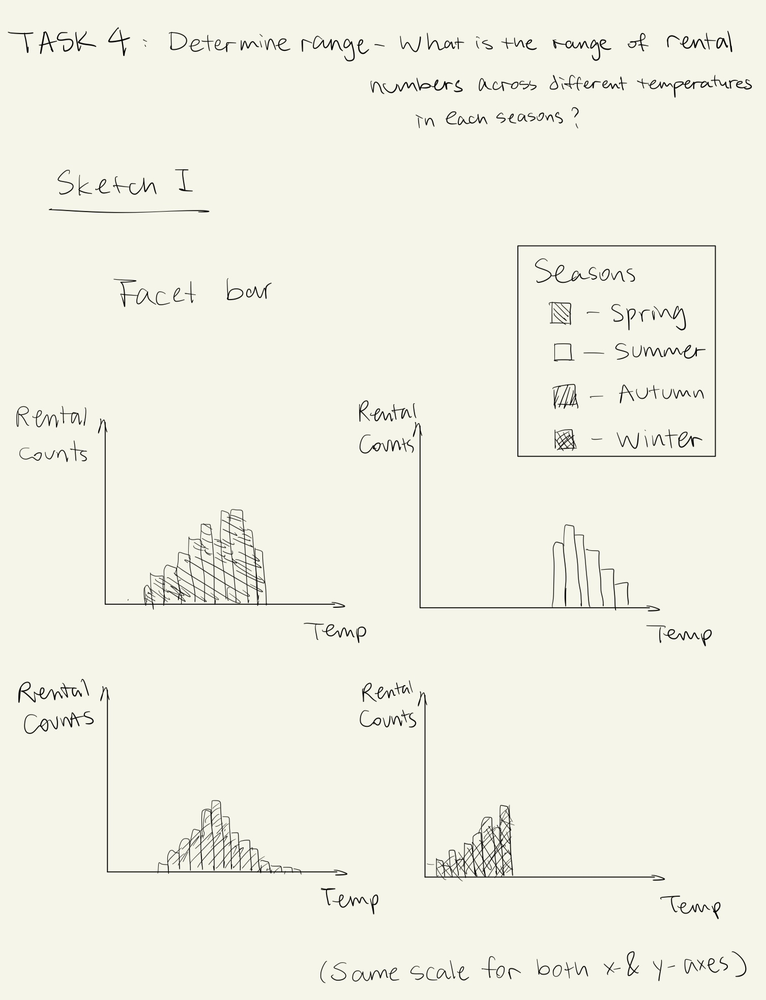

Sketch 1 is the best among three, because bar mark is clearer to show the overall trend and the range of the distribution.

Sketch 2 has the line mark, which fails to present the distribution and related information such as symmetry.

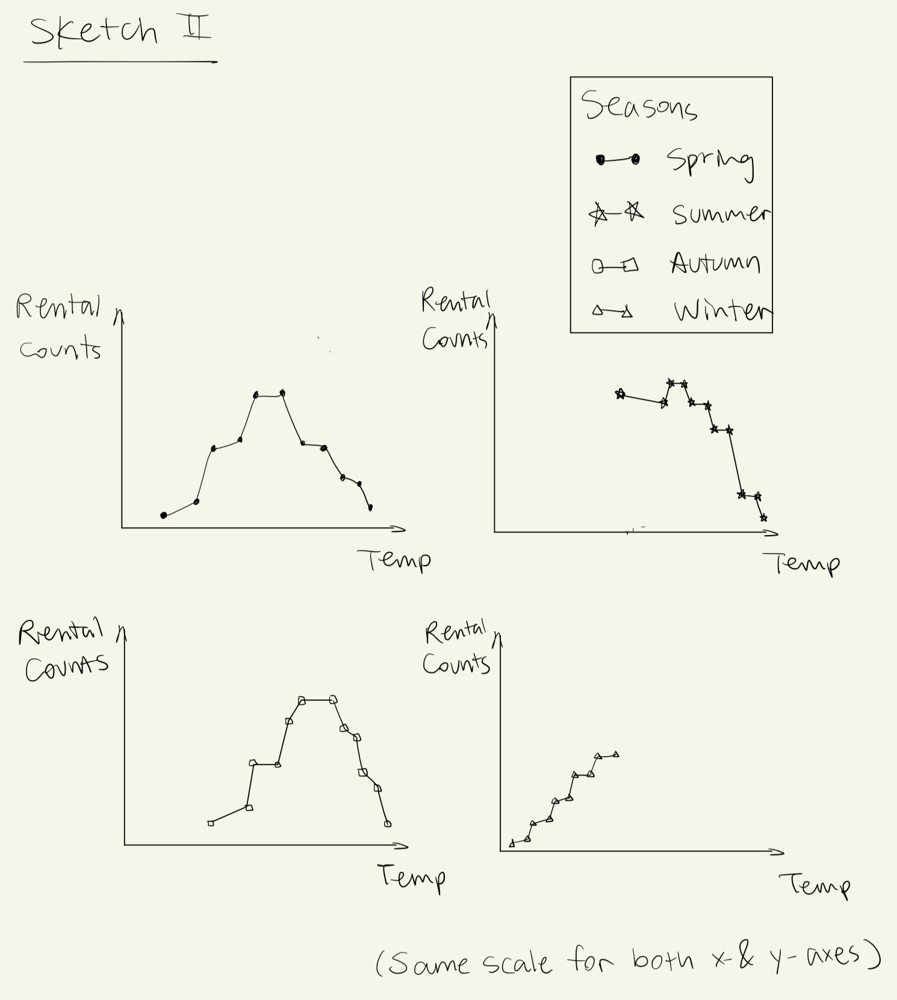

Sketch 3 uses the point mark, which is also not good at showing distributions, as the range and boundary can be hard to see. Especially when different color hues are mixed and presented in clusters, it can be messy and difficult to determine the shape of the distribution.

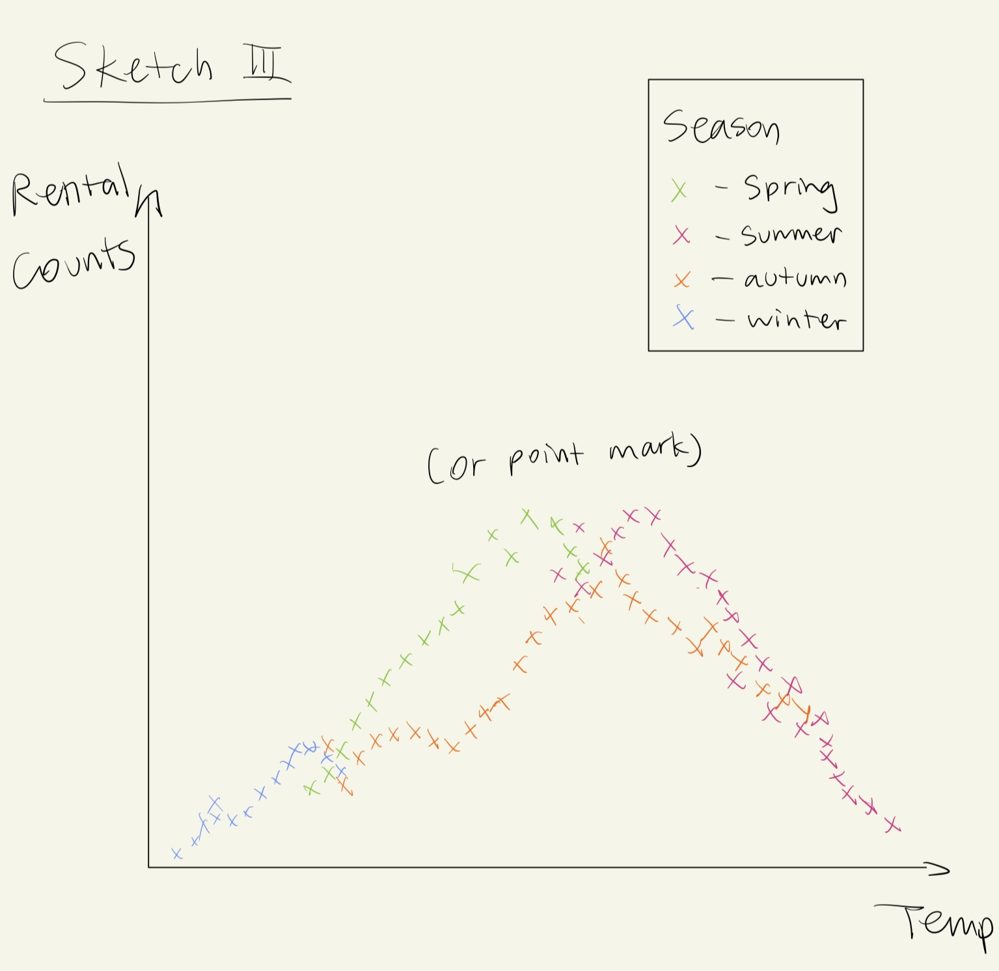

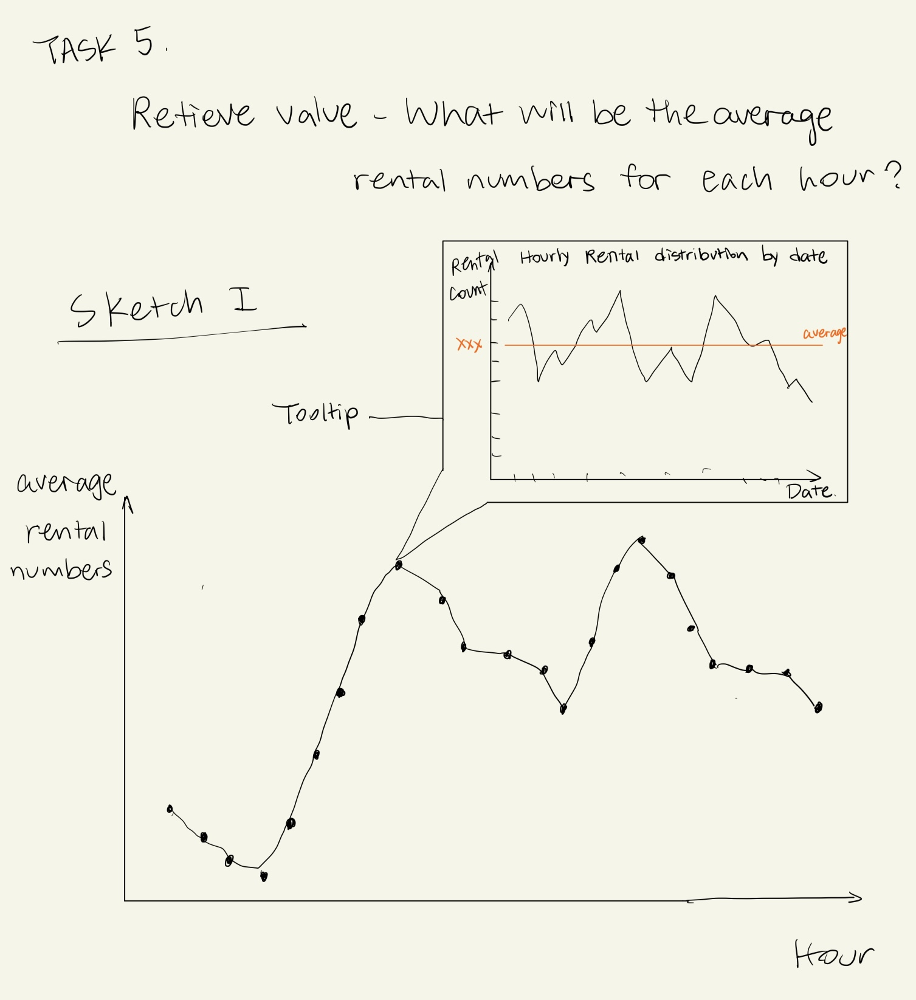

### Critique
The Sketch I is effective at demonstrating the general trendline and changes on the mean number of rental bikes among various hours of day to the viewers. The marks are made of lines (point = true), with vertical position (y-axis) of the mark representing mean rental numbers whereas horizontal position (x-axis) representing the hours fo day. The channels such as size, shape or colour has not been integrated in this viz, making it slightly monotonous. In terms of expressiveness, it presents all the calculated mean values of bike rentals. On the effectiveness side, more work can be done to capture the attention of the audience. 


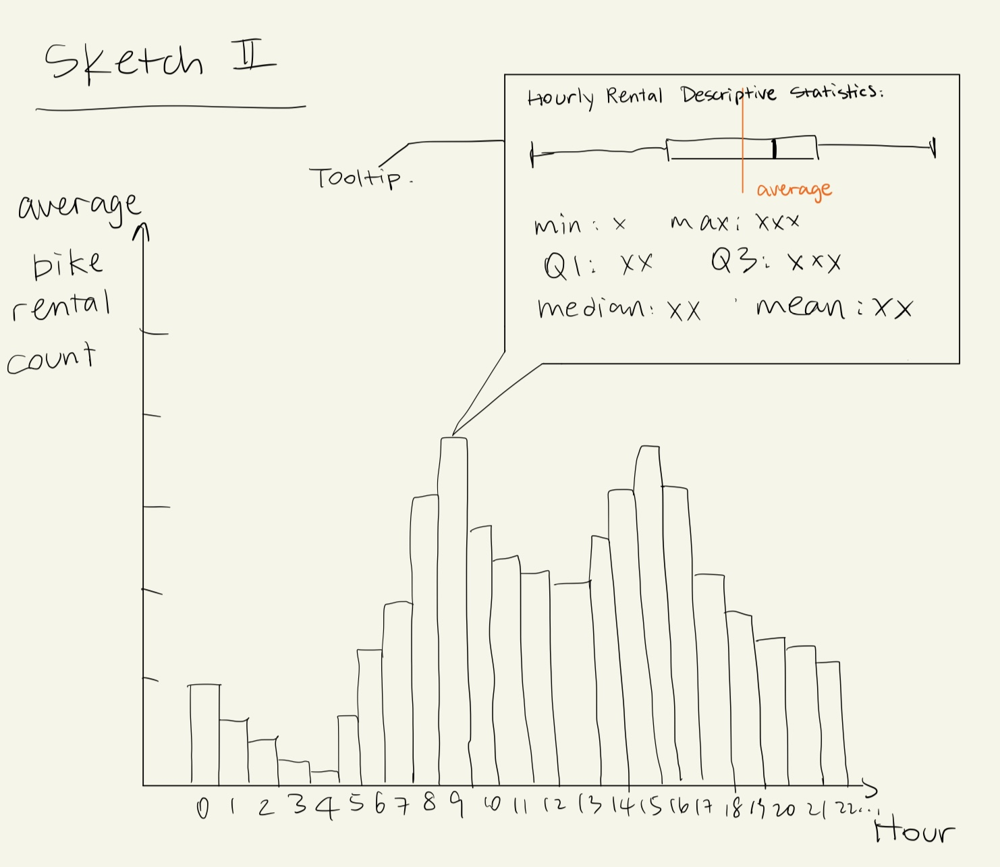

### Critique
The Sketch II is effective at showing the specific quantitative values of rental numbers among various hours of day to the viewers. The marks are made of bars and boxplots added on the tooltip, with vertical position (y-axis) of the mark representing mean rental numbers whereas horizontal position (x-axis) representing the hours fo day. It's expressive and effective as a cross-breed chart, like xenographics. It goes back to the original idea of William Playfiar, where we manage to present more data under limited space. 

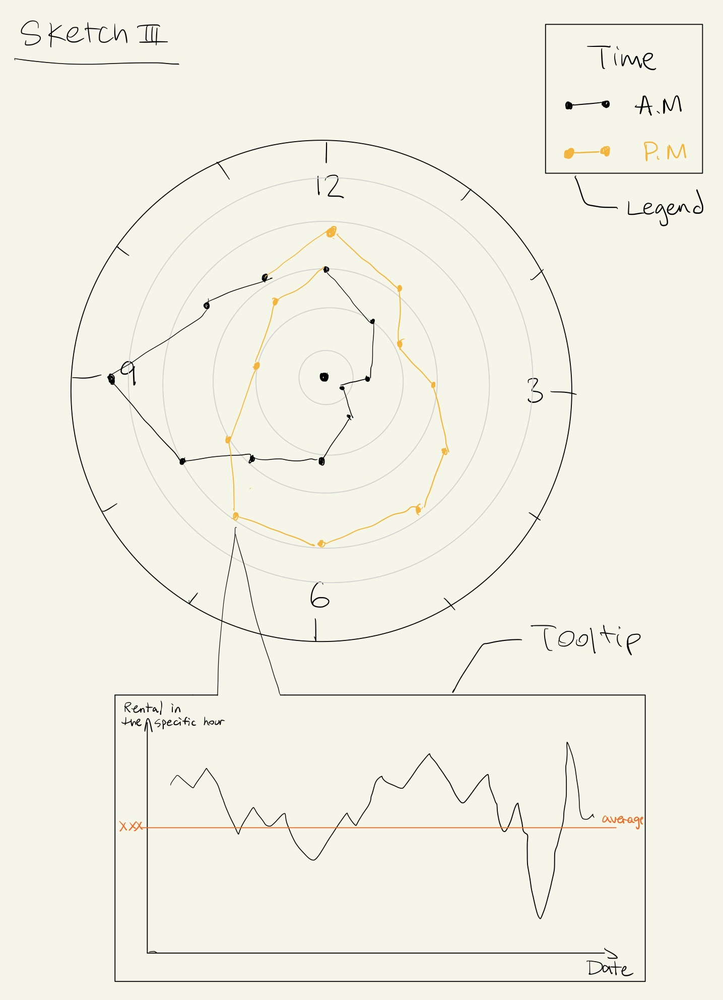

### Critique
The Sketch III is effective at appealing both viewer groups including general public and rental company. The marks are made of lines within a clock shape (effectiveness on the human eyes perception) and line charts added on the tooltip (expressiveness on presenting a condensed amount of data), with vertical position (y-axis) of the mark representing specific rental numbers whereas horizontal position (x-axis) representing the hours and date. 

#### **High-fidelity Sketches for Each Task**

#### *Task 1*

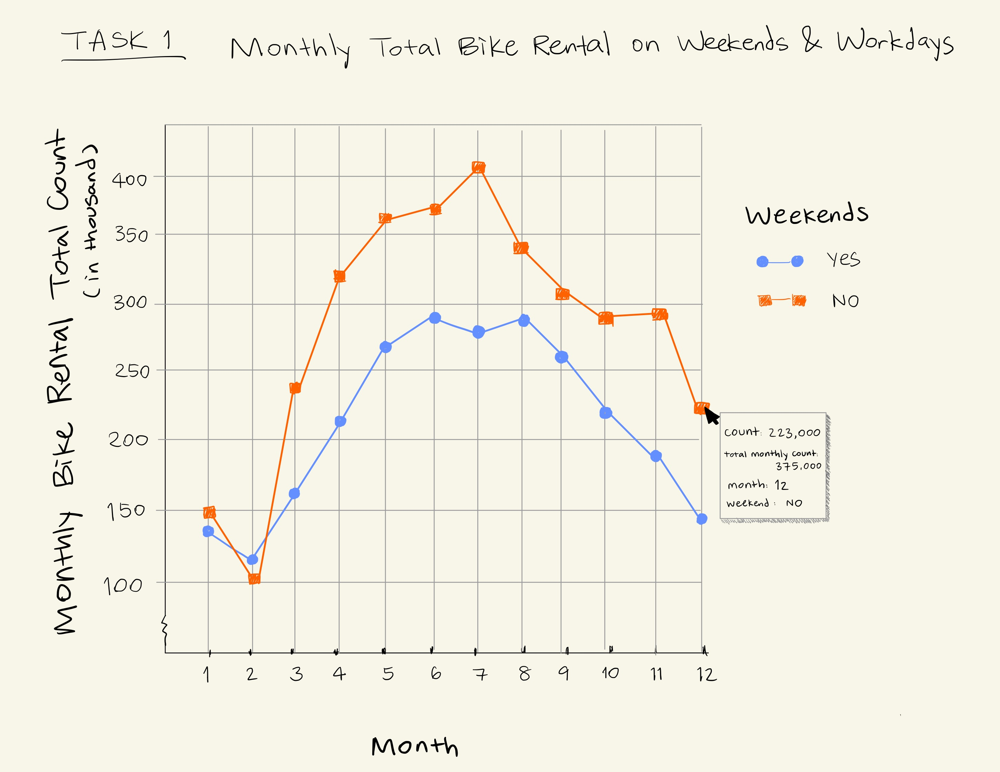

**Explanation:** The high-fidelity sketch of task 1 uses a line chart. It uses the circle and square mark and the color channel to encode the quantitative data of bike rental on either weekend or workday. For x-axis, it encodes the ordinal data of month, and for y-axis, it encodes the quantitative data of bike rental in thousands. The line mark shows the trend for weekend data and non-weekend data throughout different months of the year, which works well for Correlate task to discover trends and correlations in the selected data. Also, the tooltip encodes the rental numbers on weekend or workday for each month, the total monthly bike rental number, the month, and whether the data is for weekend or workday.

#### *Task 2*

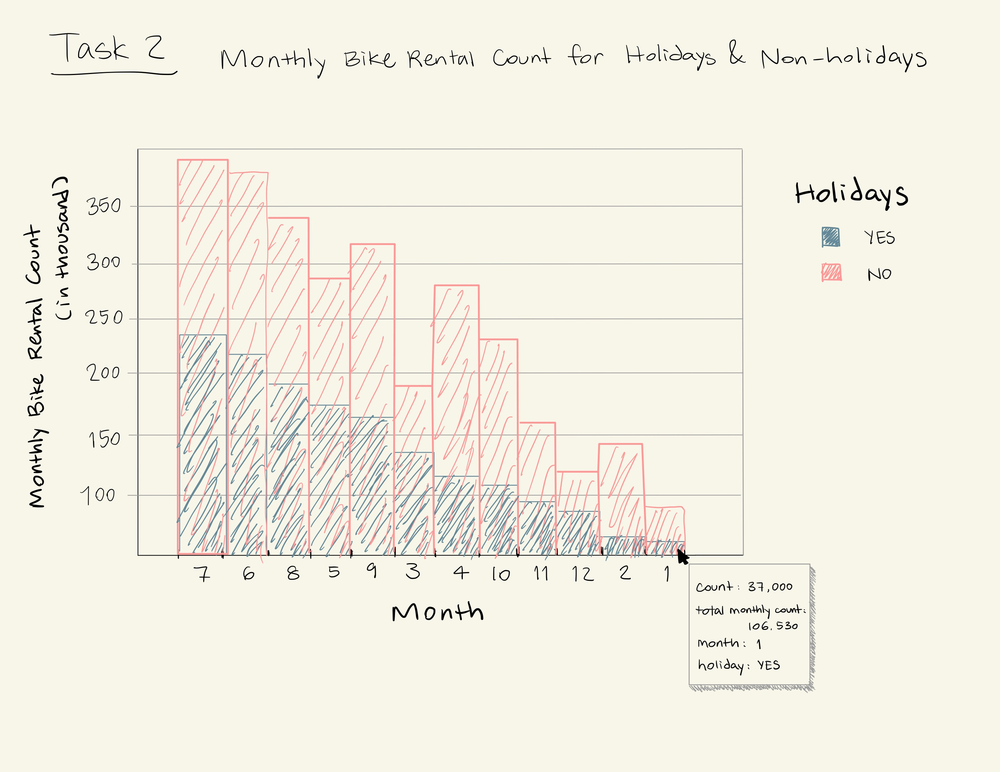

**Explanation:** The high-fidelity sketch of task 2 uses a sorted bar chart. It uses the bar mark to show the rental numbers under holidays and non-holidays in each month. The color channel encodes either holiday or non-holiday. For x-axis, it encodes the ordinal data of month, and for y-axis, it encodes the quantitative data of bike rental number in thousands. Also, the tooltip encodes the total bike rental numbers on holiday or non-holiday in each month, the total monthly bike rental number, month, and whether the data is for holiday or non-holiday. In the sketch shown above, it was sorted from the highest to lowest number of bike rentals on holidays in each month. However, it can also sorted as the same way for non-holiday data. Sorted bar chart is effective in solving Sort problems as it could rank the data in specific order based on quantity. Moreover, since the chart is not stacked (i.e. bars of both holiday and non-holiday data start from 0), it allows the audience to sort and rank non-holiday data as well, which is highly functioning.

#### *Task 3*

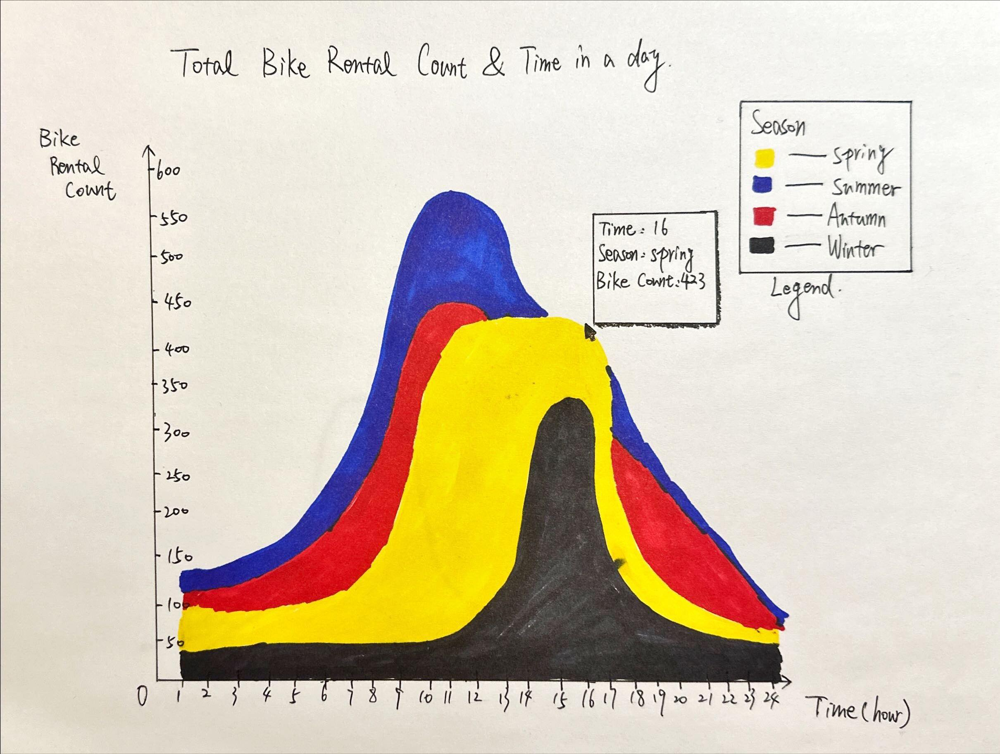

**Explanation:** The high-fidelity sketch of task 3 uses a layered area chart. It uses the area mark to show the rental numbers under each hour in different seasons. The color channel encodes the four seasons. For x-axis, it encodes the ordinal data of hours, and for y-axis, it encodes the quantitative data of bike rental number in thousands. Also, the tooltip encodes the total bike rental numbers, the hour, and seasons. In the sketch shown above, using layered plot enables the audience to compare between different distribution. Note that both area and line plot is effective in providing the general trend of the distribution. However, specifically in the bike rental case, the cardinality of the categorical data (i.e., Seasons) is 4, which can be messy and difficult for human eyes to perceive the distribution and separate different color hues if choosing the line mark. Therefore, it would be more effective to solve the Characterize Distribution task using a translucent layered area plot by modifying the opacity.

#### *Task 4*

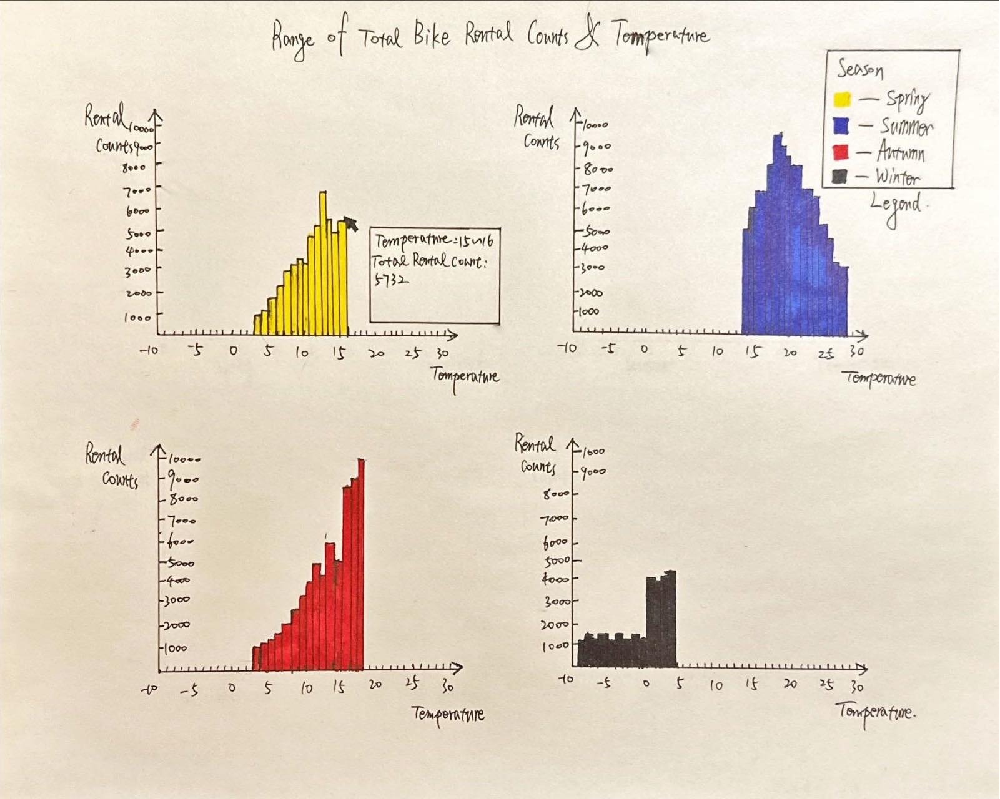

**Explanation:** The high-fidelity sketch of task 4 uses a faceted bar chart. It uses the bar mark to show the rental numbers under different temperatures in each season. The color channel encodes the four seasons. For x-axis, it encodes the quantitative data of temperature, and for y-axis, it encodes the quantitative data of bike rental number in thousands. Also, the tooltip encodes the total bike rental number and the corresponded temperature. Note that both x-axis and y-axis uses a same scale for each facet, which enhances the utility of comparing among the four. Also, using bar mark is effective in presenting the range of the data and letting human eyes perceive and determine the range for the bar chart in each facet. Moreover, the faceted chart uses two columns, making the visualization as a 2x2 graph, enabling the audience to compare between each season either horizontally or vertically, while utilizing the space optimally to present details on each facet chart to a maximum view on the screen.

#### *Task 5*

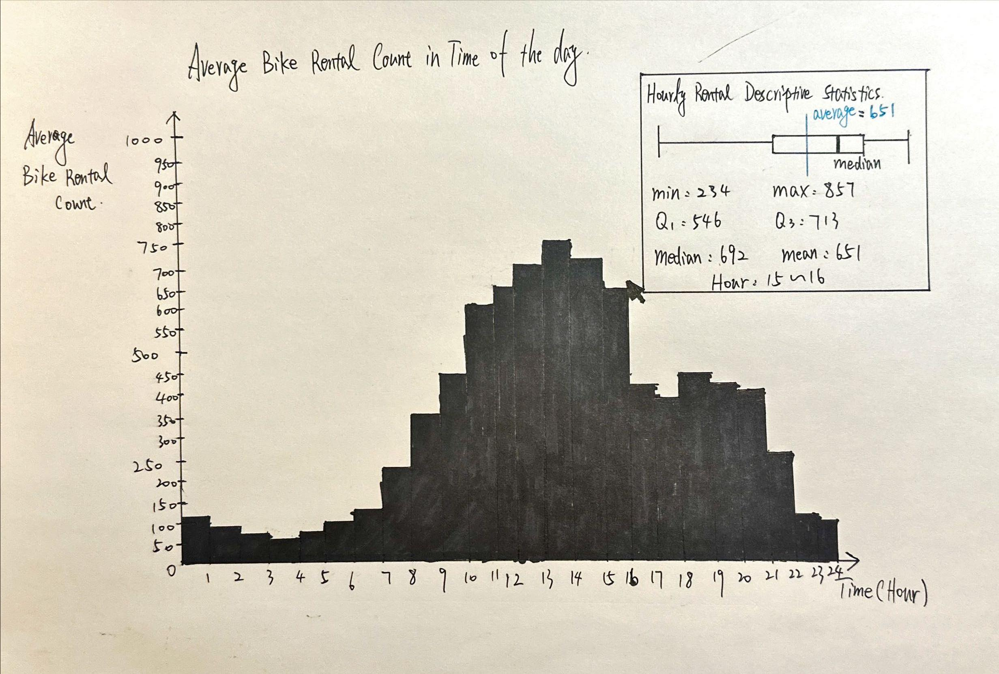

**Explanation:** The high-fidelity sketch of task 5 uses a hybrid bar/boxplot chart. It uses the bar mark to show the average rental numbers under different times of the day. For x-axis, it encodes the ordinal data of hour, and for y-axis, it encodes the quantitative data of average bike rental number in thousands. Also, the tooltip encodes the hourly rental descriptive statistics using a box plot with a rule mark. In the tooltip visualization, the boxplot mark encodes the descriptive statistics of minimum, Q1, Q3, median, IQR, and maximum value of bike rental within a certain hour. The y-axis has no encoding meaning, and the x-axis encodes the hourly bike rental quantitative data. The rule mark with the blue color encodes the mean value of bike rental of the specific hour. In addition, the tooltip also encodes the hour specified. The interactive hybrid bar/boxplot chart not only offers us a general description of the overall distribution of average bike rental per hour in a day, but also is effective in task such as Retrieve Value, because it enables the audience to obtain a certain average hourly rental value by hovering the mouse over a specific hour they look for, and get a sense of the average or even more descriptive statistics related in a systematic way.

## Next Steps

1. Summarize tasks and modify (i.e. Extend/Narrow/Generalize) questions in each task based on the high-fidelity sketches if needed.
2. Wrangle dataset to prepare for visualizing sketches in Altair. (For example, filter dataset based on certain conditions)
3. Come up with certain interactions for each visualization, for example, UI widgets that are absent in sketches, and finish preliminary sketches and prototypes.
4. Visualize each design in Altair.
5. Write decription and justification for each visualization.


#### Timeline
- Oct. 31 - Nov. 7: Finish Step 1 (Muhan & Kevin)
- Nov. 8 - Nov. 14: Finish Step 2 (Yuyang) and 3 (Muhan & Kevin)
- Before Nov. 24: Finish Step 4 (Yuyang)
- Before final deadline (i.e. Nov. 28): Finish Step 5 (Muhan & Kevin)